# Fungal electronics system identification
EDA, 19/02. RM

Notebook shows exploratory data analysis to demonstrate key features in data. Overall aim is to guide system description, which is the first part of system identification, i.e. if we can identify essential and non-essential features in data, we can describe a basic set of physical parameters to guide creation of a model ("grey box model").

### Load data & libraries

In [4]:
import pickle as p
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import normalize
from sysidentpy.model_structure_selection import FROLS
from sysidentpy.basis_function._basis_function import Polynomial, Fourier
from sysidentpy.metrics import root_relative_squared_error
from sysidentpy.utils.display_results import results
from sysidentpy.utils.plotting import plot_residues_correlation, plot_results
from sysidentpy.residues.residues_correlation import compute_residues_autocorrelation, compute_cross_correlation

def get_data(data_name, ref_name):
    with open(f"../data/{ref_name}", 'rb') as f:
        inp_sig = p.load(f)
    with open(f"../data/{data_name}", 'rb') as f:
        data = p.load(f)
    return data, inp_sig


# data, ref_signal = get_data("Two_blocks_900Hz", "Two_blocks_900Hz_ref")
data, ref_signal = get_data("Control_Two_blocks_900Hz", "Two_blocks_900Hz_ref")
print(f"Data dimensions of experiment: {len(data)} features, {len(data[0])} measurements per feature.")


Data dimensions of experiment: 2 features, 2900001 measurements per feature.


### Get data sample & visualise

In [6]:
sample_data = []
chunk = 10000

for i in range(len(data)):
    sample_data.append(data[i][0:chunk])

sample_df = pd.DataFrame(sample_data).T
ref_df    = pd.DataFrame(ref_signal[0:chunk])

In [8]:
sample_df.head()

,0,1
0,0.000000,0.000000
1,4.885774,1.128796
2,3.722727,1.129124
3,2.815361,1.128467
4,2.687521,1.130110


In [7]:
import plotly.express as px

fig = px.line(sample_df, title = "Sample, 1k timesteps")
fig.show()
ref_fig = px.line(ref_df, title = "Reference signal")
ref_fig.show()

In [9]:
fig = px.line(sample_df.iloc[8][10:], title = "Representative 'nice' signal, 1k timesteps")
fig.show()
fig2 = px.line(sample_df.iloc[23][10:], title = "Representative 'bad' signal, 1k timesteps")
fig2.show()
ref_fig = px.line(ref_df.iloc[10:], title = "Reference signal")
ref_fig.show()

- Signals clearly being transduced through network as waves seen whose period matches almost exactly to the reference signal (whole 0-1 cycle)
- Amplitudes of measured signals differ (reflecting efficiency of link between mycelium and electrode?) so signals will need normalizing; some signals are pretty much dead (= no connection to mycelium?) so these will need to be excluded on some programmatic basis
- All signals seem to have different degrees of lag from initial signal, likely indicating distance from input source. If this could be measured, could estimate speed of conduction and hence underlying mechanism
- Large spikes likely to be noise. Some higher frequency noise also present, unclear on source; from electronics signals can be filtered, but drift in measurement caused by moisture, other organisms etc will have to be black boxed by model (can estiamate via ACF and PACF)

# Stationarity & Auto Correlation

In [10]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
# sig_1, sig_2 = sample_df.T.iloc[8], sample_df.T.iloc[20]
sig_1, sig_2 = sample_df.T.iloc[0], sample_df.T.iloc[1]
sig_in = ref_df

In [11]:
def get_stationarity(signal):
    X = np.array(signal)
    split = int(len(X) / 2)
    X1, X2 = X[0:split], X[split:]
    mean1, mean2 = X1.mean(), X2.mean()
    var1, var2 = X1.var(), X2.var()
    print('mean1=%f, mean2=%f' % (mean1, mean2))
    print('variance1=%f, variance2=%f' % (var1, var2))

print(f"Signal 1 stationarity analysis: {get_stationarity(sig_1)}")
print(f"Signal 2 stationarity analysis: {get_stationarity(sig_2)}")


mean1=1.105931, mean2=1.098070
variance1=8.734648, variance2=8.757455
Signal 1 stationarity analysis: None
mean1=1.126050, mean2=1.124722
variance1=0.000289, variance2=0.000040
Signal 2 stationarity analysis: None


<AxesSubplot: >

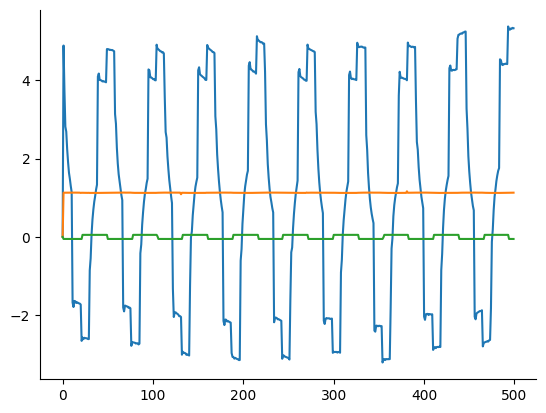

In [12]:
sig_1.iloc[0:500].plot()
sig_2.iloc[0:500].plot()
sig_in_smol = sig_in[0].iloc[0:500] * 0.01
sig_in_smol.plot()

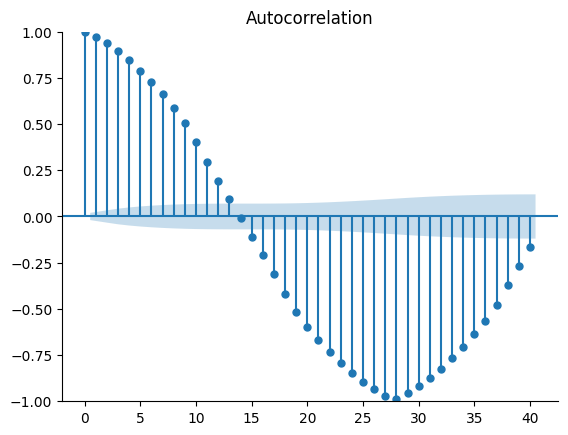

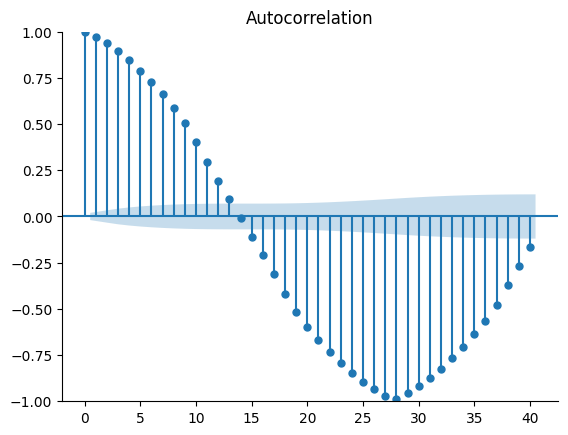

In [13]:
plot_acf(np.array(sig_1), lags = 40)
# plot_acf(sig_2)

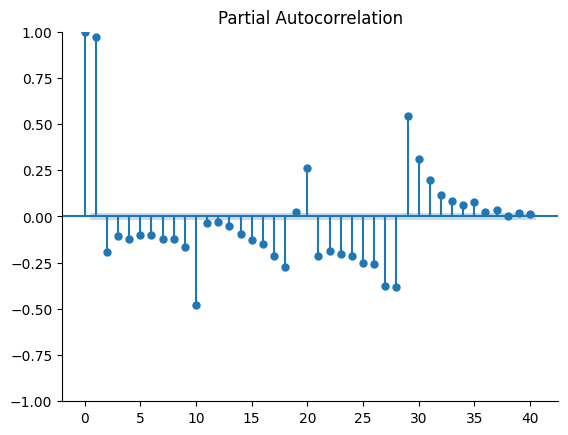

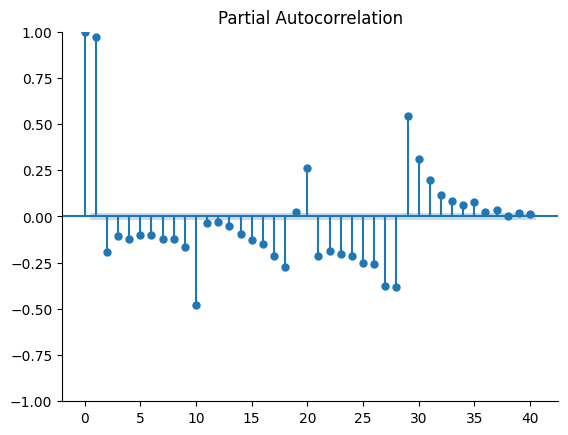

In [14]:
plot_pacf(np.array(sig_1), method="ols", lags=40)


In [15]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import correlate
import plotly.express as px

def plot_xcorr(x, y): 
    "Plot cross-correlation (full) between two signals."
    N = max(len(x), len(y)) 
    n = min(len(x), len(y)) 

    if N == len(y): 
        lags = np.arange(-N + 1, n) 
    else: 
        lags = np.arange(-n + 1, N) 
    c = correlate(x / np.std(x), y / np.std(y), 'full') 

    # plt.plot(lags, c / n) 
    # plt.plot(c) 
    # plt.show() 
    fig = px.line(c, title="Cross correlation between signals")
    fig.show()

def get_lags(a,b):
    correlation = np.correlate(a, b, mode='same')
    return np.argmax(correlation) - int(len(correlation)/2)

print(f"correlation coefficient, signal in and signal 1: {np.corrcoef( sig_in[0].iloc[0:10], sig_1.iloc[0:10] )[0,1]}")
print(f"correlation coefficient, signal in and signal 2: {np.corrcoef( sig_in[0].iloc[0:10], sig_2.iloc[0:10] )[0,1]}")
print(f"correlation coefficient, signal 1 and signal 2: {np.corrcoef( sig_1.iloc[0:10], sig_2.iloc[0:10] )[0,1]}")
plot_xcorr(sig_in[0].iloc[0:10], sig_1.iloc[0:10])
plot_xcorr(sig_in[0], sig_2)
plot_xcorr(sig_1, sig_2)
print(f"Delay between signal in and signal 1: {get_lags(sig_in[0], sig_1)}")
print(f"Delay between signal in and signal 2: {get_lags(sig_in[0], sig_2)}")
print(f"Delay between signal 1 and signal 2: {get_lags(sig_1, sig_2)}")

correlation coefficient, signal in and signal 1: -0.5872319999303949
correlation coefficient, signal in and signal 2: -0.9999674292307144
correlation coefficient, signal 1 and signal 2: 0.5840275033785566


Delay between signal in and signal 1: -13
Delay between signal in and signal 2: 30
Delay between signal 1 and signal 2: 38


# Normalize and replot

In [20]:

def normalize_data(data):
    data = data.reshape(-1,1)
    return (data - np.min(data)) / (np.max(data) - np.min(data))

def normalize_list(data):
    newdata = []
    for i in data:
        newdata.append(normalize_data(i[:chunksize]))
    return newdata

chunksize = 10000
y = normalize_list(data)
X = normalize_data(ref_signal[:chunksize])


## Start with single trace

In [21]:
X_train, X_test, y_train, y_test = train_test_split(X, y[0], test_size=0.2, random_state=42, shuffle=False)

Root relative square error 1.045082473171567
  Regressors  Parameters             ERR
0     y(k-1)  7.1739E-01  9.86979478E-01
1     y(k-2)  2.3745E-01  4.68081605E-04
2    x1(k-1)  3.5439E-02  5.38010335E-04


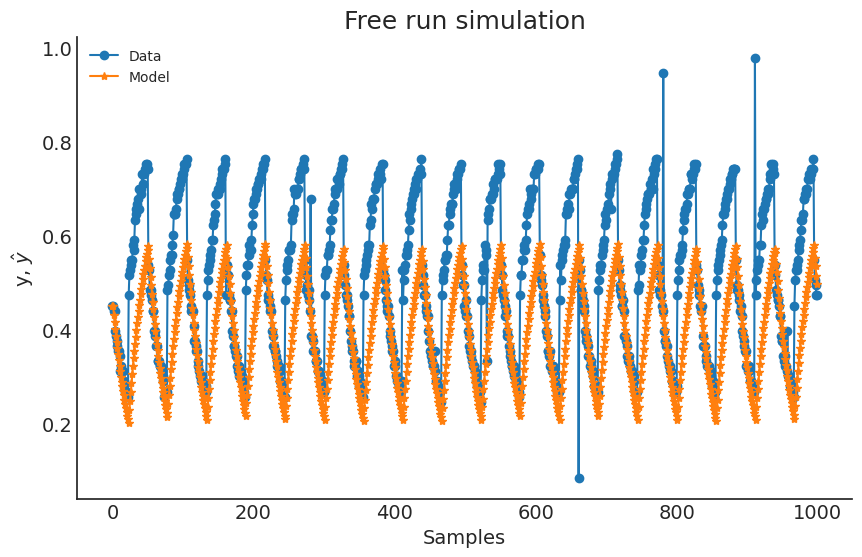

In [23]:
'''Model selection'''
basis_function = Polynomial(degree=2)
# basis_function = Fourier(degree=2, n=2, p=2*np.pi, ensemble=True)

'''Default model from documentation'''
model = FROLS(
    order_selection=True,
    n_info_values=3,
    extended_least_squares=False,
    ylag=2, xlag=2,
    info_criteria='aic',
    estimator='least_squares',
    basis_function=basis_function
)

'''Fit and predict'''
model.fit(X=X_train, y=y_train)
yhat = model.predict(X=X_test, y=y_test)

'''Evaluate'''
rrse = root_relative_squared_error(y_test, yhat)
print(f"Root relative square error {rrse}")
r = pd.DataFrame(
    results(
        model.final_model, model.theta, model.err,
        model.n_terms, err_precision=8, dtype='sci'
        ),
    columns=['Regressors', 'Parameters', 'ERR'])
print(r)

plot_results(y=y_test, yhat=yhat, n=1000)


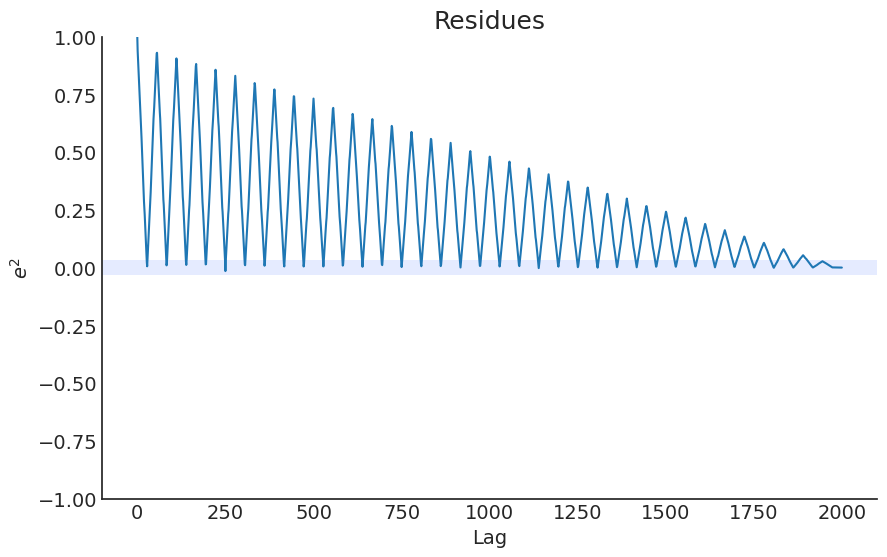

In [25]:
ee = compute_residues_autocorrelation(y_test, yhat)
plot_residues_correlation(data=ee, title="Residues", ylabel="$e^2$")


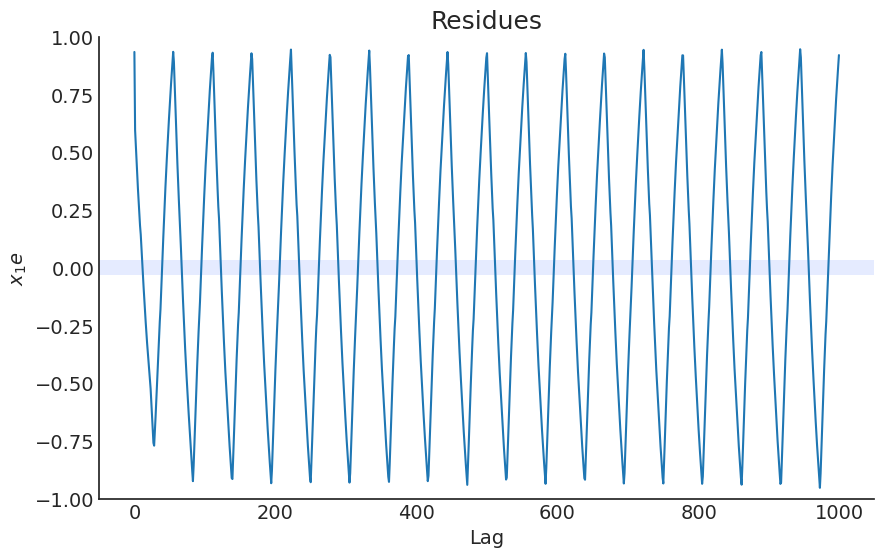

In [26]:
x1e = compute_cross_correlation(y_test, yhat, X_test)
plot_residues_correlation(data=x1e, title="Residues", ylabel="$x_1e$")


# NN Model

In [27]:
from torch import nn
from sysidentpy.metrics import mean_squared_error
from sysidentpy.utils.generate_data import get_siso_data
from sysidentpy.neural_network import NARXNN

from sysidentpy.basis_function._basis_function import Polynomial, Fourier
from sysidentpy.utils.generate_data import get_siso_data
from sysidentpy.utils.plotting import plot_residues_correlation, plot_results
from sysidentpy.residues.residues_correlation import compute_residues_autocorrelation, compute_cross_correlation
from sysidentpy.utils.narmax_tools import regressor_code
import torch

device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Using {device} device")


Using cuda device


In [29]:
basis_function = Polynomial(degree=1)

narx_net = NARXNN(
    ylag=2,
    xlag=2,
    basis_function=basis_function,
    model_type="NARMAX",
    loss_func='mse_loss',
    optimizer='Adam',
    epochs=2000,
    verbose=False,
    #device="cuda",
    optim_params={
        'betas': (0.9, 0.999),
        'eps': 1e-05
        } # optional parameters of the optimizer
)

regressors = regressor_code(X=X_train,
    xlag=2,
    ylag=2,
    model_type="NARMAX",
    model_representation="neural_network",
    basis_function=basis_function
)
n_features = regressors.shape[0] # the number of features of the NARX net
n_features


4

In [33]:
class NARX(nn.Module):
    def __init__(self):
        super().__init__()
        self.lin = nn.Linear(n_features, 30)
        self.lin2 = nn.Linear(30, 30)
        self.lin3 = nn.Linear(30, 1)
        self.tanh = nn.Tanh()

    def forward(self, xb):
        z = self.lin(xb)
        z = self.tanh(z)
        z = self.lin2(z)
        z = self.tanh(z)
        z = self.lin3(z)
        return z
    
narx_net.net = NARX()
# narx_net.net.to(torch.device('cuda'))
narx_net.fit(X=X_train, y=y_train, X_test=X_test, y_test=y_test)


MSE:  0.004601633560086826


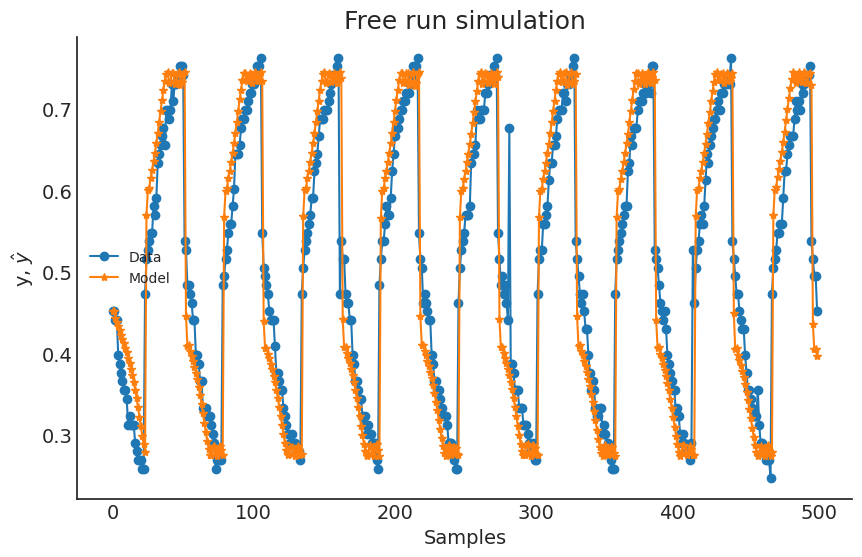

In [59]:
yhat = narx_net.predict(X=X_test, y=y_test)
print("MSE: ", mean_squared_error(y_test, yhat))
plot_results(y=y_test, yhat=yhat, n=500)

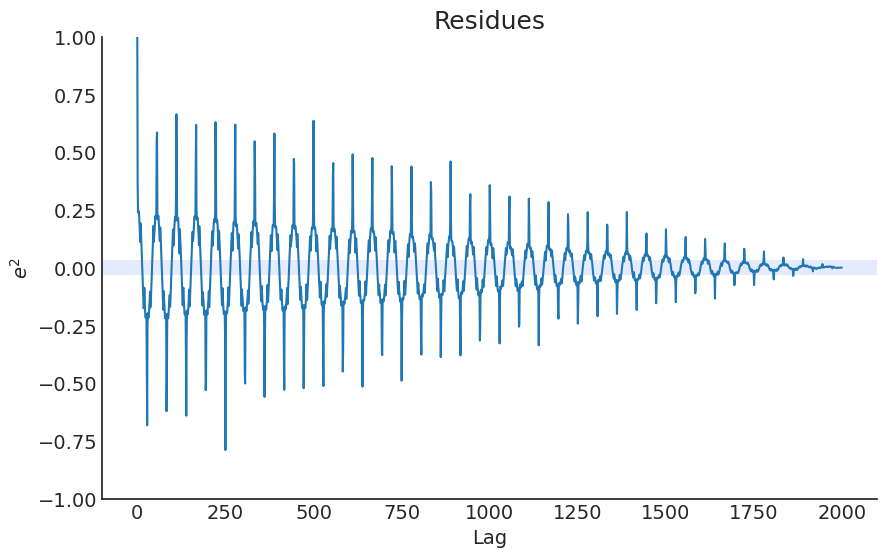

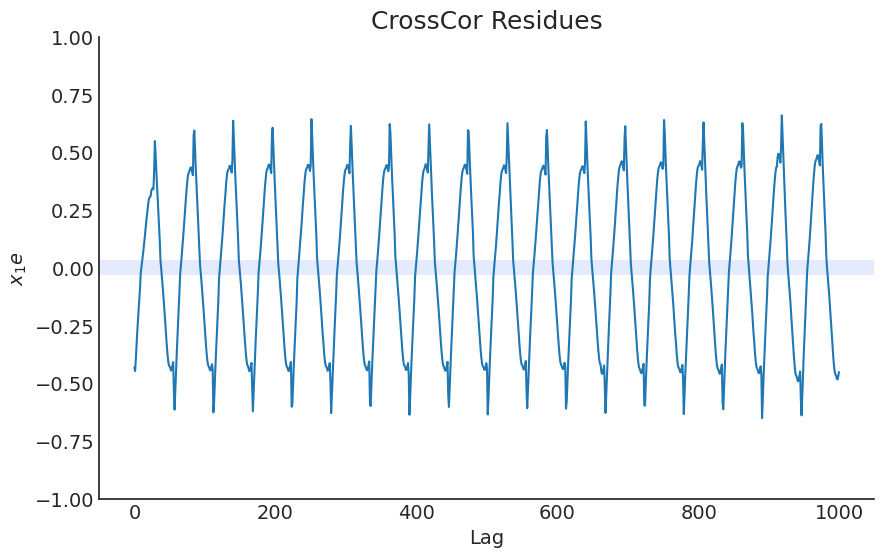

In [37]:
ee = compute_residues_autocorrelation(y_test, yhat)
plot_residues_correlation(data=ee, title="Residues", ylabel="$e^2$")
x1e = compute_cross_correlation(y_test, yhat, X_test)
plot_residues_correlation(data=x1e, title="CrossCor Residues", ylabel="$x_1e$")

In [42]:
y[1][:2000].shape

(2000, 1)

MSE:  0.040714321461471296


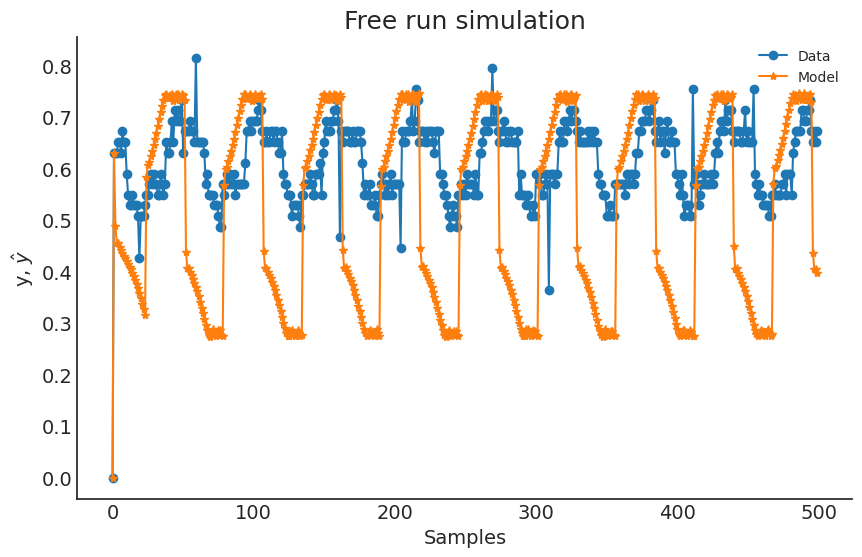

In [58]:
y_val = y[6][:2000]
yhat_val = narx_net.predict(X=X_test, y=y_val)
print("MSE: ", mean_squared_error(y_val, yhat_val))
plot_results(y=y_val, yhat=yhat_val, n=500)

MSE:  0.037738115035012273


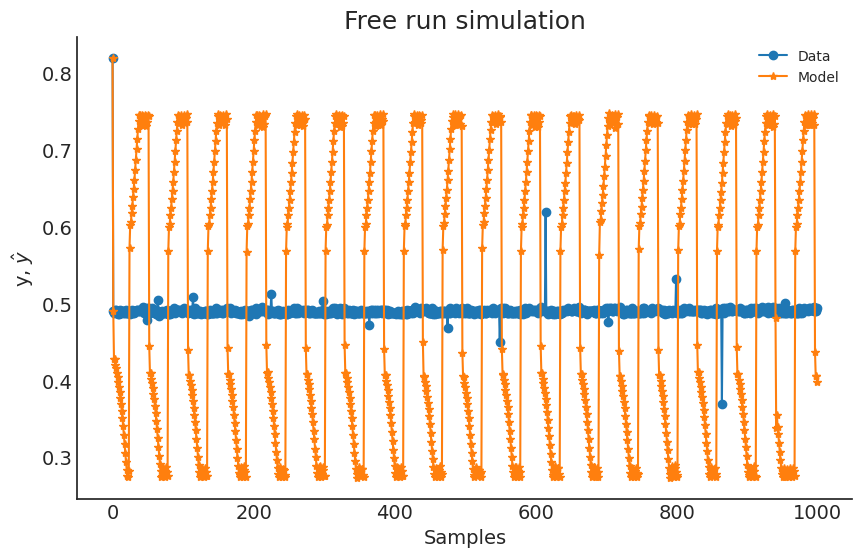

In [46]:
y_val = y[23][:2000]
yhat_val = narx_net.predict(X=X_test, y=y_val)
print("MSE: ", mean_squared_error(y_val, yhat_val))
plot_results(y=y_val, yhat=yhat_val, n=1000)

In [70]:
narx_net.regressor_code

array([[1001],
       [1002],
       [2001],
       [2002]])

In [62]:
for param in narx_net.net.parameters():
  print(param.data)

tensor([[ 1.3306e+00, -1.4317e+00,  1.9033e+00, -1.7543e+00],
        [ 1.6396e+00, -1.5221e+00, -2.4869e-01,  1.1621e-01],
        [ 1.3390e-02, -4.9867e-02,  3.6375e-02,  4.6825e-03],
        [-2.3684e-02, -1.8150e-02,  3.7396e-02,  6.2380e-03],
        [-4.2729e+00,  4.1886e+00, -5.7836e-01,  5.7368e-01],
        [ 5.8066e+00, -7.2213e+00,  5.9356e-01,  2.1155e-01],
        [ 5.2874e-01, -4.6742e-01, -4.8625e-04, -6.9122e-02],
        [-1.7783e+00,  1.4763e+00,  2.1676e+00, -1.8583e+00],
        [ 8.1377e-03, -2.2630e-02,  1.0209e-02,  7.3453e-03],
        [ 2.0441e-01, -5.2877e+00,  4.8230e+00, -2.3168e+00],
        [-6.4457e-02,  4.1091e-02,  7.4268e-03,  1.9208e-02],
        [ 1.4154e-02, -4.0888e-02,  2.4111e-02,  1.4645e-02],
        [-4.3267e-01,  3.8200e-01,  1.1926e-02,  6.6240e-02],
        [-1.3856e+00,  1.3315e+00, -1.7382e-01,  1.9390e-01],
        [-3.3062e-02,  1.1680e-02,  1.2027e-02,  1.1719e-02],
        [ 3.1532e-01, -2.6195e-01, -3.0577e-02, -4.9393e-02],
        